# PPL to Performance Correlation


In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
sys.path.insert(0, os.path.abspath('../../../../'))
#print(sys.path)

import glob
import json
import re
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats
import time
import copy
import pandas as pd
from pandas import DataFrame
from examples.few_shot.scripts.display_results import get_checkpoint_step_form_modelname
from examples.few_shot.tasks_organization import get_task_display_groups, get_tasks_to_groups_mapping, get_groups_to_groups_mapping, invert_dict

task_display_groups = get_task_display_groups()
task_display_groups["all_no_blimp"] = [x for x in task_display_groups["all"] if not x.startswith("blimp")]
task_to_groups = get_tasks_to_groups_mapping(task_display_groups)
groups_to_groups = get_groups_to_groups_mapping(task_display_groups)

# update task to groups with groups to groups -- to show all for groups, etc


Read the raw results file:

In [27]:
# This is the path to the raw results file generated with the script

# python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-06-14-ppl-eval -o _results/2021-06-14-ppl-eval-results.tsv -r 
#results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-06-14-ppl-eval-results.tsv.raw.jsonl"

# python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-06-30-ppl-eval-moe -o _results/2021-06-30-ppl-eval-moe.tsv -r
#results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-06-30-ppl-eval-moe.tsv.raw.jsonl"

#python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-06-14-ppl-eval /checkpoint/tbmihaylov/few_shot/2021-06-30-ppl-eval-moe  -o _results/2021-07-06-ppl-eval-results-dense-and-moe-r.tsv -r 
#python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-06-14-ppl-eval/**/*fs0*_results.json /checkpoint/tbmihaylov/few_shot/2021-06-30-ppl-eval-moe/**/*fs0*_results.json  -o _results/2021-07-06-ppl-eval-results-dense-and-moe-r.tsv -r 
#results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-07-06-ppl-eval-results-dense-and-moe.tsv.raw.jsonl"

#python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-07-23-ppl-eval-checkpoints -o _results/2021-07-23-ppl-eval-checkpoints.tsv -r 
results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-07-23-ppl-eval-checkpoints.tsv.raw.jsonl"

#python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-07-calibration -o _results/2021-07-calibration.tsv -r 
#results_json = "/private/home/tbmihaylov/fairseq-xlmg/_results/2021-07-calibration.tsv.raw.jsonl"

#results_json = "/checkpoint/tbmihaylov/few_shot/multilingual_xnli_1.3B_gpt3_setting_checkpoints/results.tsv.raw.jsonl"

# python examples/few_shot/scripts/collect_results.py -i /checkpoint/tbmihaylov/few_shot/2021-09-28-ppl-eval -o /checkpoint/tbmihaylov/few_shot/2021-09-28-ppl-eval/results.tsv -v preferred_metrics_mean -r
results_json = "/checkpoint/tbmihaylov/few_shot/2021-09-28-ppl-eval/results.tsv.raw.jsonl"

In [28]:
if not results_json.endswith(".tsv.raw.jsonl"):
    raise ValueError("Your file must ends with tsv.raw.jsonl")

In [29]:
if not results_json.endswith(".tsv.raw.jsonl"):
    raise ValueError("Your file must ends with tsv.raw.jsonl")

In [4]:
plot_by_steps = True
language = "en"
model_name_to_checkpoints = {}
results = []

expand_task_groups = True  # This will copy the task results and add them as "group" results. 
                           # This way when aggregate we get the group avg scores! 

    
x_min, x_max = 20000, 1000000
if x_min is not None:
    print(f"Filtering x >= {x_min}! Set x_min to None to remove the filter!")
if x_max is not None:
    print(f"Filtering x <= {x_max}! Set x_max to None to remove the filter!")
    
current_tasks_to_groups = {}
with open(results_json) as f_res:
    for line in f_res:
        line = line.strip()
        item = json.loads(line)
        for k in list(item.keys()):
            if k.startswith("ppl_candidates_full_prompt__"):
                del item[k]
                
        current_task_name = item["task"]
        
        if language!= "any" and item["language"] != language:
            continue
            
        if item["model_name"] == "moe_15B" and plot_by_steps:
            item["model_name"] = "moe_15B__step00572000"
            
        if "checkpoint_steps" not in item: 
            item["checkpoint_steps"] = get_checkpoint_step_form_modelname(item["model_name"])
        
        if "checkpoint_steps" in item:
            if x_min is not None and item["checkpoint_steps"] < x_min:
                continue
            if x_max is not None and item["checkpoint_steps"] > x_max:
                continue
        
        model_name_to_checkpoints[item["model_name"]] = item["checkpoint_steps"]
        
        if "macro_F1::scores" in item:
            item["macro_F1::max"] = max(item["macro_F1::scores"])
            item["macro_F1::min"] = max(item["macro_F1::scores"])
        if "accuracy::scores" in item:
            item["accuracy::max"] = max(item["accuracy::scores"])
            item["accuracy::min"] = max(item["accuracy::scores"])
        results.append(item)
        
        if expand_task_groups:
            task_groups = task_to_groups.get(current_task_name, [])
            for tg in task_groups:
                group_result = copy.deepcopy(item)
                group_result["task"] = tg
                group_result["template"] = "*"
                results.append(group_result)
            if current_task_name not in current_tasks_to_groups:
                current_tasks_to_groups[current_task_name] = task_groups
                
print(f"{len(results)} items (expand_task_groups:{expand_task_groups})")
current_groups = invert_dict(current_tasks_to_groups)
for k,v in current_groups.items():
    print_v = v[:10] + (['...'] if len(v)>10 else [])
    print(f"-{k} ({len(v)}): {', '.join(print_v)}")
print()


Filtering x >= 20000! Set x_min to None to remove the filter!
Filtering x <= 1000000! Set x_max to None to remove the filter!
2970 items (expand_task_groups:True)
-LM (2): hellaswag, storycloze
-all (74): arcchallenge, arceasy, blimp__adjunct_island, blimp__anaphor_gender_agreement, blimp__anaphor_number_agreement, blimp__animate_subject_passive, blimp__animate_subject_trans, blimp__causative, blimp__complex_np_island, blimp__coordinate_structure_constraint_complex_left_branch, ...
-all_no_blimp (7): arcchallenge, arceasy, hellaswag, openbookqa, piqa, storycloze, winogrande
-blimp__all (67): blimp__adjunct_island, blimp__anaphor_gender_agreement, blimp__anaphor_number_agreement, blimp__animate_subject_passive, blimp__animate_subject_trans, blimp__causative, blimp__complex_np_island, blimp__coordinate_structure_constraint_complex_left_branch, blimp__coordinate_structure_constraint_object_extraction, blimp__determiner_noun_agreement_1, ...
-blimp__anaphor_agreement (2): blimp__anaphor_ge

In [30]:
print(model_name_to_checkpoints)

{'moe_15B__step00020000': 20000, 'moe_15B__step00040000': 40000, 'moe_15B__step00060000': 60000, 'moe_15B__step00080000': 80000, 'moe_15B__step00100000': 100000, 'moe_15B__step00120000': 120000, 'moe_15B__step00140000': 140000, 'moe_15B__step00160000': 160000, 'moe_15B__step00180000': 180000, 'moe_15B__step00200000': 200000}


In [31]:
# Calculating contrast values
for row in results:
    for ppl_corr, ppl_incorr in [("ppl_full_correct_gold", "ppl_full_incorrect_gold"), 
                              ("ppl_answer_correct_gold", "ppl_answer_incorrect_gold")]:
        ppl_corr_scores = row.get(ppl_corr+"::scores", None)
        ppl_incorr_scores = row.get(ppl_incorr+"::scores", None)
        
        
        if not isinstance(ppl_corr_scores, list) or not isinstance(ppl_incorr_scores, list):
            continue
                
        for cf_name, cf in [
                            #("diff", lambda pos,neg: pos-neg), 
                            ("ratio", lambda pos,neg: pos/neg),
                            #("ratio_sum", lambda pos,neg: pos/(pos+neg)),
                           ]:
            new_val_name = f"contrast-ppl-{cf_name}--{ppl_corr}-{ppl_incorr}"
            #print(new_val_name)
            
            new_val_scores = [cf(pos, neg) for pos,neg in zip(ppl_corr_scores, ppl_incorr_scores)]
            if cf_name == "diff":
                print(new_val_scores)
            row[new_val_name+"::scores"] = new_val_scores
            row[new_val_name+"::mean"] = np.mean(new_val_scores)
            row[new_val_name+"::std"] = np.std(new_val_scores)
            
            #print(row[new_val_name+"::scores"])



In [32]:
df = DataFrame.from_records(results)
print({x: 0.0 for x in set(df["model_name"])})
# drop some overgenerated columns
columns_to_drop = [x for x in list(df.columns) if x.startswith("ppl_candidates_full_prompt__")]
df.drop(columns=columns_to_drop, inplace=True)
list(df.columns)

{'moe_15B__step00120000': 0.0, 'moe_15B__step00200000': 0.0, 'moe_15B__step00040000': 0.0, 'moe_15B__step00140000': 0.0, 'moe_15B__step00160000': 0.0, 'moe_15B__step00180000': 0.0, 'moe_15B__step00100000': 0.0, 'moe_15B__step00080000': 0.0, 'moe_15B__step00020000': 0.0, 'moe_15B__step00060000': 0.0}


['model_name',
 'task',
 'language',
 'template',
 'nb_few_shot_samples',
 'calibration_options',
 'calibrator_name',
 'train_set',
 'valid_set',
 'eval_set',
 'train_lang',
 'valid_lang',
 'ppl_common_prefix::scores',
 'ppl_common_prefix::mean',
 'ppl_common_prefix::std',
 'ppl_common_prefix::mean_confidence_interval',
 'ppl_selected_candidate::scores',
 'ppl_selected_candidate::mean',
 'ppl_selected_candidate::std',
 'ppl_selected_candidate::mean_confidence_interval',
 'ppl_full_selected_candidate::scores',
 'ppl_full_selected_candidate::mean',
 'ppl_full_selected_candidate::std',
 'ppl_full_selected_candidate::mean_confidence_interval',
 'ppl_candidates_full_prompt::scores',
 'ppl_candidates_full_prompt::mean',
 'ppl_candidates_full_prompt::std',
 'ppl_candidates_full_prompt::mean_confidence_interval',
 'ppl_candidates::scores',
 'ppl_candidates::mean',
 'ppl_candidates::std',
 'ppl_candidates::mean_confidence_interval',
 'accuracy::scores',
 'accuracy::mean',
 'accuracy::std',
 'ac

The results has the followinf columns:

In [33]:
#list(df.columns)
ppl_fields_cor_to_incorr = [x for x in list(df.columns) if x.startswith("contrast")]
print(ppl_fields_cor_to_incorr)

#df[ppl_fields_cor_to_incorr]

['contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::scores', 'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean', 'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::std', 'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::scores', 'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean', 'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::std']


# Calculate correlations

In [34]:
df_correlations  = df

# Calculate correlations
ppl_fields_cor_to_incorr = [x.rstrip("::scores") for x in list(df_correlations.columns) if x.startswith("contrast") and x.endswith("::scores")]
print(ppl_fields_cor_to_incorr)
fields1 = sorted(["ppl_candidates_full_prompt",
           "ppl_candidates",
           "ppl_full_correct_gold", 
           "ppl_full_incorrect_gold", 
           "ppl_answer_correct_gold",
           "ppl_answer_incorrect_gold"
#            "ppl_selected_candidate",
#            "ppl_full_selected_candidate",
#            "ppl_common_prefix"
          ] + ppl_fields_cor_to_incorr)
fields2 = ["accuracy"]

for idx, row in df_correlations.iterrows():
    for fld1 in fields1:
        fld1_scores =  f"{fld1}::scores"
        
        #print(row[fld1_scores])
        #break
        fld1_score_vals = row[fld1_scores]
#         if fld1_scores.startswith("contrast"):
#             print(type(fld1_score_vals))
            
#             break

        if not isinstance(fld1_score_vals, list):
            continue
        if len(fld1_score_vals) < 2:
            continue
            
            
        fld1_score_vals = row[fld1_scores]
        for fld2 in fields2:
            fld2_scores =  f"{fld2}::scores"
            fld2_score_vals = row[fld2_scores]
            if not isinstance(fld2_score_vals, list):
                continue
            if len(fld2_score_vals) < 2:
                continue  
            
            try:
                pearsonr, pvalue = stats.pearsonr(fld1_score_vals, fld2_score_vals) 
                for corr_k, corr_v in [("pearsonr", pearsonr), ("pvalue",pvalue)]:
                    corr_key = f"corr-model-runs-{fld1}-{fld2}-{corr_k}"
                    row[corr_key] = corr_v  
                    if "pearsonr" in corr_key and "candidates" in corr_key and abs(corr_v) > 0.5:
                        print(row["task"], row["model_name"], row["nb_few_shot_samples"], corr_key, corr_v)
            except Exception as e:
                print(f"Error with {idx}:"+ str(e))
df_correlations.columns

['contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold', 'contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold']
copa 1.3B_gpt3_setting__step00020000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.8821347071210965
all 1.3B_gpt3_setting__step00020000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.8821347071210965
super_glue 1.3B_gpt3_setting__step00020000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.8821347071210965
all_no_blimp 1.3B_gpt3_setting__step00020000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.8821347071210965
cb 1.3B_gpt3_setting__step00020000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6320316059625088
all 1.3B_gpt3_setting__step00020000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6320316059625088
super_glue 1.3B_gpt3_setting__step00020000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6320316059625088
all_no_blimp 1.3B_gpt3_setting__step00020000 32 c

scienceqa 1.3B_gpt3_setting__step00050000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8828742350091625
all_no_blimp 1.3B_gpt3_setting__step00050000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8828742350091625
hellaswag 1.3B_gpt3_setting__step00050000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5363335213087971
all 1.3B_gpt3_setting__step00050000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5363335213087971
commonsense 1.3B_gpt3_setting__step00050000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5363335213087971
LM 1.3B_gpt3_setting__step00050000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5363335213087971
all_no_blimp 1.3B_gpt3_setting__step00050000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5363335213087971
cb 1.3B_gpt3_setting__step00100000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5439009023057331
all 1.3B_gpt3_se

/private/home/tbmihaylov/.conda/envs/fairseq-20210102/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


boolq 1.3B_gpt3_setting__step00150000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.834227802498946
all 1.3B_gpt3_setting__step00150000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.834227802498946
super_glue 1.3B_gpt3_setting__step00150000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.834227802498946
all_no_blimp 1.3B_gpt3_setting__step00150000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.834227802498946
Error with 2073:array must not contain infs or NaNs
Error with 2073:array must not contain infs or NaNs
Error with 2073:array must not contain infs or NaNs
piqa 1.3B_gpt3_setting__step00150000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5661750151008695
Error with 2074:array must not contain infs or NaNs
Error with 2074:array must not contain infs or NaNs
Error with 2074:array must not contain infs or NaNs
all 1.3B_gpt3_setting__step00150000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5661750151008695
Error

all 1.3B_gpt3_setting__step00250000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6395713417264486
super_glue 1.3B_gpt3_setting__step00250000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6395713417264486
all_no_blimp 1.3B_gpt3_setting__step00250000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6395713417264486
rte 1.3B_gpt3_setting__step00250000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6763787967189164
rte 1.3B_gpt3_setting__step00250000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.7902642388936622
all 1.3B_gpt3_setting__step00250000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6763787967189164
all 1.3B_gpt3_setting__step00250000 32 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.7902642388936622
super_glue 1.3B_gpt3_setting__step00250000 32 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6763787967189164
super_glue 1.3B_gpt3_setting__step00250000 32 corr-model-r

blimp__all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.9516405023044159
all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.9516405023044159
blimp__island_effects 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.9516405023044159
blimp__coordinate_structure_constraint_object_extraction 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7154841080503633
blimp__coordinate_structure_constraint_object_extraction 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6014190255222619
blimp__all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7154841080503633
blimp__all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6014190255222619
all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 

blimp__existential_there_subject_raising 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.6536652649281358
blimp__all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.6536652649281358
all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.6536652649281358
blimp__control_raising 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.6536652649281358
blimp__expletive_it_object_raising 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8406560513469052
blimp__all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8406560513469052
all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8406560513469052
blimp__control_raising 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8406560513469052
blimp__inchoative 1.3B_gpt3_

blimp__regular_plural_subject_verb_agreement_2 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8649249224707247
blimp__regular_plural_subject_verb_agreement_2 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6086309410840232
blimp__all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8649249224707247
blimp__all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6086309410840232
all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8649249224707247
all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6086309410840232
blimp__subject_verb_agreement 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8649249224707247
blimp__subject_verb_agreement 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidat

scienceqa 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6997122634783549
all_no_blimp 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6997122634783549
hellaswag 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7262045476839262
all 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7262045476839262
commonsense 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7262045476839262
LM 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7262045476839262
all_no_blimp 1.3B_gpt3_setting__step00020000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7262045476839262
blimp__adjunct_island 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5343995437839555
blimp__adjunct_island 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_fu

blimp__determiner_noun_agreement_with_adjective_1 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6123439443525212
blimp__all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6123439443525212
all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6123439443525212
blimp__determiner_noun_agreement 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6123439443525212
blimp__distractor_agreement_relational_noun 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.7538919271498543
blimp__all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.7538919271498543
all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.7538919271498543
blimp__subject_verb_agreement 1.3B_gpt3_se

blimp__all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6013052173500659
all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6013052173500659
blimp__island_effects 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6013052173500659
blimp__left_branch_island_simple_question 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.5777533066995308
blimp__left_branch_island_simple_question 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6515251044567312
blimp__all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.5777533066995308
blimp__all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6515251044567312
all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.5777533066995308
all 1.3B_g

blimp__all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5935245642492016
all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5935245642492016
blimp__binding 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5935245642492016
blimp__regular_plural_subject_verb_agreement_2 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9337919209951364
blimp__regular_plural_subject_verb_agreement_2 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.7339146863565106
blimp__all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9337919209951364
blimp__all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.7339146863565106
all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9337919209951364
all 

all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.7828739408863542
blimp__filler_gap_dependency 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.7828739408863542
rte 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6801229916786039
all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6801229916786039
super_glue 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6801229916786039
all_no_blimp 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6801229916786039
wsc 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.780489157649743
all 1.3B_gpt3_setting__step00050000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.780489157649743
super_glue 1.3B_gpt3_setting__step00050000 4 corr-model-runs-pp

blimp__causative 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5702093172109103
blimp__all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5702093172109103
all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5702093172109103
blimp__argument_structure 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5702093172109103
blimp__complex_np_island 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8698300464134661
blimp__all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8698300464134661
all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8698300464134661
blimp__island_effects 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8698300464134661
blimp__c

all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8709357646277851
all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.5484371976880934
blimp__control_raising 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8709357646277851
blimp__control_raising 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.5484371976880934
blimp__existential_there_quantifiers_1 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.7758695092259353
blimp__all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.7758695092259353
all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.7758695092259353
blimp__quantifiers 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.

Error with 2982:array must not contain infs or NaNs
Error with 2982:array must not contain infs or NaNs
Error with 2982:array must not contain infs or NaNs
Error with 2982:array must not contain infs or NaNs
Error with 2983:array must not contain infs or NaNs
Error with 2983:array must not contain infs or NaNs
Error with 2983:array must not contain infs or NaNs
Error with 2983:array must not contain infs or NaNs
Error with 2984:array must not contain infs or NaNs
Error with 2984:array must not contain infs or NaNs
Error with 2984:array must not contain infs or NaNs
Error with 2984:array must not contain infs or NaNs
Error with 2985:array must not contain infs or NaNs
Error with 2985:array must not contain infs or NaNs
Error with 2985:array must not contain infs or NaNs
Error with 2985:array must not contain infs or NaNs
Error with 2998:array must not contain infs or NaNs
Error with 2998:array must not contain infs or NaNs
Error with 2998:array must not contain infs or NaNs
Error with 2

blimp__wh_questions_subject_gap_long_distance 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6711836624469438
blimp__wh_questions_subject_gap_long_distance 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6683425624943901
blimp__all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6711836624469438
blimp__all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6683425624943901
all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6711836624469438
all 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6683425624943901
blimp__filler_gap_dependency 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6711836624469438
blimp__filler_gap_dependency 1.3B_gpt3_setting__step00100000 4 corr-model-runs-ppl_candidates_f

blimp__determiner_noun_agreement_1 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6351906819478013
blimp__all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6351906819478013
all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6351906819478013
blimp__determiner_noun_agreement 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6351906819478013
blimp__determiner_noun_agreement_2 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.516219423898078
blimp__determiner_noun_agreement_2 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5240870691428912
blimp__all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.516219423898078
blimp__all 1.3B_gpt3_setting__step00150000 4 corr-model-r

blimp__inchoative 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.905145727322421
blimp__all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.905145727322421
all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.905145727322421
blimp__argument_structure 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.905145727322421
blimp__irregular_past_participle_adjectives 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.5311828698512338
blimp__all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.5311828698512338
all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.5311828698512338
blimp__irregular_forms 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.5311828698512338

blimp__binding 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7410640278081364
blimp__principle_a_domain_2 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6304367608182809
blimp__principle_a_domain_2 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.9189505391270383
blimp__all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6304367608182809
blimp__all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.9189505391270383
all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6304367608182809
all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.9189505391270383
blimp__binding 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.6304367608182809
blimp__binding 1.3B_gpt3_se

scienceqa 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.5972956901136991
all_no_blimp 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.8308752622392801
all_no_blimp 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.5972956901136991
arcchallenge 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5052559841548214
all 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5052559841548214
scienceqa 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5052559841548214
all_no_blimp 1.3B_gpt3_setting__step00150000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5052559841548214
blimp__adjunct_island 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9597149846313202
blimp__a

blimp__all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9752842538331645
blimp__all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6401927338790747
all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9752842538331645
all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6401927338790747
blimp__quantifiers 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9752842538331645
blimp__quantifiers 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6401927338790747
blimp__existential_there_subject_raising 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.6890084979235951
blimp__all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr 0.689008497923595

Error with 3633:array must not contain infs or NaNs
Error with 3633:array must not contain infs or NaNs
Error with 3633:array must not contain infs or NaNs
Error with 3633:array must not contain infs or NaNs
Error with 3634:array must not contain infs or NaNs
Error with 3634:array must not contain infs or NaNs
Error with 3634:array must not contain infs or NaNs
Error with 3634:array must not contain infs or NaNs
Error with 3635:array must not contain infs or NaNs
Error with 3635:array must not contain infs or NaNs
Error with 3635:array must not contain infs or NaNs
Error with 3635:array must not contain infs or NaNs
blimp__principle_a_domain_1 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7497377765221183
blimp__all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7497377765221183
all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.7497377765221183
blimp__binding 1.3B_gpt3

all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.8578406779275286
super_glue 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.8578406779275286
all_no_blimp 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.8578406779275286
Error with 3752:array must not contain infs or NaNs
Error with 3752:array must not contain infs or NaNs
Error with 3752:array must not contain infs or NaNs
piqa 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8779508557634486
Error with 3753:array must not contain infs or NaNs
Error with 3753:array must not contain infs or NaNs
Error with 3753:array must not contain infs or NaNs
all 1.3B_gpt3_setting__step00200000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8779508557634486
Error with 3754:array must not contain infs or NaNs
Error with 3754:array must not contain infs or NaNs
Error with 

blimp__subject_verb_agreement 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.8328430052274435
blimp__distractor_agreement_relative_clause 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8541610274342102
blimp__all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8541610274342102
all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8541610274342102
blimp__subject_verb_agreement 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.8541610274342102
blimp__drop_argument 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6416616247351431
blimp__all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6416616247351431
all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl

blimp__all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.9074753170434579
blimp__all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5419562601327675
all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.9074753170434579
all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5419562601327675
blimp__npi_licensing 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.9074753170434579
blimp__npi_licensing 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.5419562601327675
blimp__npi_present_1 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6248257434109553
blimp__all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.6248257434109553
all 1.3B_gpt3_s

blimp__regular_plural_subject_verb_agreement_2 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5755101135907178
blimp__all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5755101135907178
all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5755101135907178
blimp__subject_verb_agreement 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.5755101135907178
blimp__sentential_negation_npi_scope 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9886398475772239
blimp__all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9886398475772239
all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9886398475772239
blimp__npi_licensing 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr -0.9886398475772239
blimp__sent

boolq 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.836868967914098
all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.836868967914098
super_glue 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.836868967914098
all_no_blimp 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates-accuracy-pearsonr 0.836868967914098
Error with 4069:array must not contain infs or NaNs
Error with 4069:array must not contain infs or NaNs
Error with 4069:array must not contain infs or NaNs
piqa 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.7691793963687987
Error with 4070:array must not contain infs or NaNs
Error with 4070:array must not contain infs or NaNs
Error with 4070:array must not contain infs or NaNs
all 1.3B_gpt3_setting__step00250000 4 corr-model-runs-ppl_candidates_full_prompt-accuracy-pearsonr -0.7691793963687987
Error with 

Index(['model_name', 'task', 'language', 'template', 'nb_few_shot_samples',
       'calibration_options', 'calibrator_name', 'train_set', 'valid_set',
       'eval_set',
       ...
       'ppl_calib_candidates_full_prompt__4::scores',
       'ppl_calib_candidates_full_prompt__4::mean',
       'ppl_calib_candidates_full_prompt__4::std',
       'ppl_calib_candidates_full_prompt__4::mean_confidence_interval',
       'ppl_calib_candidates_full_prompt__E::scores',
       'ppl_calib_candidates_full_prompt__E::mean',
       'ppl_calib_candidates_full_prompt__E::std',
       'ppl_calib_candidates_full_prompt__E::mean_confidence_interval',
       'run_params::arcchallenge_calibration_options',
       'run_params::arcchallenge_template'],
      dtype='object', length=280)

In [35]:
def cb_view(df, values=["_metric_val", "_metric_val_std"], model_headers_on_top=True):
    pt = pd.pivot_table(df, values=values, index=["task", "language", "template", "nb_few_shot_samples", "_metric", "calibration", "run_params::scoring", "run_params::train_sep"],
                        columns=['model_name',
                                ], aggfunc=np.mean)
    if model_headers_on_top:
        pt = pt.swaplevel(0, 1, axis=1).sort_index(axis=1)
    return pt


filtered_df = df 

ppl_columns = ["ppl_full_correct_gold::mean", "ppl_full_correct_gold::std", 
                                  "ppl_full_incorrect_gold::mean", "ppl_full_incorrect_gold::std" 
                                 ]

view_cols = ["accuracy::mean", "accuracy::std"] + ["ppl_common_prefix::mean"] +  ppl_columns + [x.replace("_full_", "_answer_") for x in ppl_columns]
pt = cb_view(filtered_df, values=[x.replace("_full_", "_answer_") for x in view_cols], model_headers_on_top=False)
out_file = results_json+"_ppl_full_all.tsv"
pt.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

pt



exported to /checkpoint/tbmihaylov/few_shot/2021-09-28-ppl-eval/results.tsv.raw.jsonl_ppl_full_all.tsv


accuracy::mean  \
model_name                                                                                                          moe_15B__step00020000   
task         language template   nb_few_shot_samples _metric  calibration run_params::scoring run_params::train_sep                         
LM           en       *          0                   accuracy False       mean                \n                                50.353140   
all          en       *          0                   accuracy False       mean                \n                                76.938684   
                                                              True        mean                \n                                25.938462   
all_no_blimp en       *          0                   accuracy False       mean                \n                                52.337043   
                                                              True        mean                \n                                25.938462   
...                                                                                                                                   ...   
piqa         en       piqa       0                   accuracy False       mean                \n                                67.519042   
scienceqa    en       *          0                   accuracy False       mean                \n                                41.052632   
                                                              True        mean                \n                                25.938462   
storycloze   en       storycloze 0                   accuracy False       mean                \n                                64.617851   
winogrande   en       winogrande 0                   accuracy False       mean                \n                                52.407261   

                                                                                                                                           \
model_name                                                                                                          moe_15B__step00040000   
task         language template   nb_few_shot_samples _metric  calibration run_params::scoring run_params::train_sep                         
LM           en       *          0                   accuracy False       mean                \n                                53.641438   
all          en       *          0                   accuracy False       mean                \n                                78.216926   
                                                              True        mean                \n                                29.277926   
all_no_blimp en       *          0                   accuracy False       mean                \n                                54.003737   
                                                              True        mean                \n                                29.277926   
...                                                                                                                                   ...   
piqa         en       piqa       0                   accuracy False       mean                \n                                68.933624   
scienceqa    en       *          0                   accuracy False       mean                \n                                42.105263   
                                                              True        mean                \n                                29.277926   
storycloze   en       storycloze 0                   accuracy False       mean                \n                                66.862640   
winogrande   en       winogrande 0                   accuracy False       mean                \n                                51.696922   

                                                                                                                                           \
model_name                      

In [36]:
# Determine the results that are missing for some models. 
missing_results = []
for ind, row in pt.iterrows():
    for [col, model], val in row.items():
        if col == "accuracy::mean" and np.isnan(val):
            missing_results.append((ind[0], ind[3], model))

set(missing_results)
#filtered_df[filtered_df["task"]=="wsc"]

{('openbookqa', 32, '1.3B_gpt3_setting__step00020000'),
 ('openbookqa', 32, '1.3B_gpt3_setting__step00200000')}

In [37]:
#df[df["run_params::train_sep"] == "\n\n"]

# Correlations by models

In [38]:
# group by model
selected_df = df

main_target_metric = 'accuracy::mean'
metrics_cols = sorted([x + "::mean" for x in list(set(selected_df["_metric"]))])

print(f"metrics_cols:{metrics_cols}")

ppl_cols = sorted([x for x in list(selected_df.columns) 
            if (x.startswith("ppl_") or x.startswith("contrast-"))  and x.endswith("::mean") and "prompt__" not in x])
print(f"ppl_cols:{ppl_cols}")

value_columns = metrics_cols + ppl_cols


metrics_cols:['accuracy::mean']
ppl_cols:['contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean', 'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean', 'ppl_answer_correct_gold::mean', 'ppl_answer_correct_lt_incorrect_gold::mean', 'ppl_answer_incorrect_gold::mean', 'ppl_answer_incorrect_min_gold::mean', 'ppl_answer_incorrect_std_gold::mean', 'ppl_calib_candidates::mean', 'ppl_calib_candidates_full_prompt::mean', 'ppl_calib_common_prefix::mean', 'ppl_calib_full_selected_candidate::mean', 'ppl_calib_selected_candidate::mean', 'ppl_candidates::mean', 'ppl_candidates_full_prompt::mean', 'ppl_common_prefix::mean', 'ppl_full_correct_gold::mean', 'ppl_full_correct_lt_incorrect_gold::mean', 'ppl_full_incorrect_gold::mean', 'ppl_full_incorrect_min_gold::mean', 'ppl_full_incorrect_std_gold::mean', 'ppl_full_selected_candidate::mean', 'ppl_selected_candidate::mean']


In [39]:
metric_pt = pd.pivot_table(selected_df, values=value_columns, index=['task',"language", 'template', 'nb_few_shot_samples', "_metric"],
                    columns=['model_name', 
                             #'calib'
                            ], aggfunc=np.mean)

out_file = results_json+"_ppl_selected_metrics.tsv"
metric_pt.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

metric_pt

exported to /checkpoint/tbmihaylov/few_shot/2021-09-28-ppl-eval/results.tsv.raw.jsonl_ppl_selected_metrics.tsv


accuracy::mean  \
model_name                                                    moe_15B__step00020000   
task         language template   nb_few_shot_samples _metric                          
LM           en       *          0                   accuracy             50.353140   
all          en       *          0                   accuracy             75.560299   
all_no_blimp en       *          0                   accuracy             44.794591   
arcchallenge en       arc_old    0                   accuracy             23.076923   
arceasy      en       arc_old    0                   accuracy             41.052632   
...                                                                             ...   
openbookqa   en       arc_old    0                   accuracy             28.800000   
piqa         en       piqa       0                   accuracy             67.519042   
scienceqa    en       *          0                   accuracy             30.976518   
storycloze   en       storycloze 0                   accuracy             64.617851   
winogrande   en       winogrande 0                   accuracy             52.407261   

                                                                                     \
model_name                                                    moe_15B__step00040000   
task         language template   nb_few_shot_samples _metric                          
LM           en       *          0                   accuracy             53.641438   
all          en       *          0                   accuracy             76.894250   
all_no_blimp en       *          0                   accuracy             46.939220   
arcchallenge en       arc_old    0                   accuracy             26.755853   
arceasy      en       arc_old    0                   accuracy             42.105263   
...                                                                             ...   
openbookqa   en       arc_old    0                   accuracy             31.800000   
piqa         en       piqa       0                   accuracy             68.933624   
scienceqa    en       *          0                   accuracy             33.553705   
storycloze   en       storycloze 0                   accuracy             66.862640   
winogrande   en       winogrande 0                   accuracy             51.696922   

                                                                                     \
model_name                                                    moe_15B__step00060000   
task         language template   nb_few_shot_samples _metric                          
LM           en       *          0                   accuracy             55.630505   
all          en       *          0                   accuracy             77.004224   
all_no_blimp en       *          0                   accuracy             48.187514   
arcchallenge en       arc_old    0                   accuracy             25.083612   
arceasy      en       arc_old    0                   accuracy             45.614035   
...                                                                             ...   
openbookqa   en       arc_old    0                   accuracy             33.600000   
piqa         en       piqa       0                   accuracy             70.293798   
scienceqa    en       *          0                   accuracy             34.765882   
storycloze   en       storycloze 0                   accuracy             68.679850   
winogrande   en       winogrande 0                   accuracy             51.460142   

                                                                                     \
model_name                                                    moe_15B__step00080000   
task         language template   nb_few_shot_samples _metric                          
LM           en       *          0                   accuracy             56.464852   
all          en       *          0                   accuracy   

<ipython-input-40-e331cde13370>:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/private/home/tbmihaylov/.conda/envs/fairseq-20210102/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


exported to /checkpoint/tbmihaylov/few_shot/2021-09-28-ppl-eval/results.tsv.raw.jsonl_ppl_correlations_by_task.tsv


_corrs-pearsonr-avg  \
LM                        en *          0 accuracy            -0.449999   
all                       en *          0 accuracy             0.064873   
all_no_blimp              en *          0 accuracy            -0.160312   
arcchallenge              en arc_old    0 accuracy            -0.326828   
arceasy                   en arc_old    0 accuracy            -0.400742   
...                                                                 ...   
storycloze                en storycloze 0 accuracy            -0.444014   
winogrande                en winogrande 0 accuracy            -0.169481   
blimp__passive_1          en blimp      0 accuracy             0.301121   
blimp__principle_a_case_2 en blimp      0 accuracy             0.171742   
piqa                      en piqa       0 accuracy            -0.018218   

                                                                              _corrs-pearsonr-max-col  \
LM                        en *          0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
all                       en *          0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
all_no_blimp              en *          0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
arcchallenge              en arc_old    0 accuracy  corr-models--ppl_common_prefix::mean--accuracy...   
arceasy                   en arc_old    0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
...                                                                                               ...   
storycloze                en storycloze 0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
winogrande                en winogrande 0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
blimp__passive_1          en blimp      0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
blimp__principle_a_case_2 en blimp      0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   
piqa                      en piqa       0 accuracy  corr-models--ppl_answer_correct_lt_incorrect_g...   

                                                    _corrs-pearsonr-max-val  \
LM                        en *          0 accuracy                 1.000000   
all                       en *          0 accuracy                 0.998641   
all_no_blimp              en *          0 accuracy                 0.975685   
arcchallenge              en arc_old    0 accuracy                -0.640784   
arceasy                   en arc_old    0 accuracy                 1.000000   
...                                                                     ...   
storycloze                en storycloze 0 accuracy                 1.000000   
winogrande                en winogrande 0 accuracy                 1.000000   
blimp__passive_1          en blimp      0 accuracy                 1.000000   
blimp__principle_a_case_2 en blimp      0 accuracy                 1.000000   
piqa                      en piqa       0 accuracy                 1.000000   

                                                    corr-models--contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean--accuracy::mean--pearsonr  \
LM                        en *          0 accuracy                                          -0.985897                                                                    
all                       en *          0 accuracy                                          -0.858243                                                                    
all_no_blimp              en *          0 accuracy                                          -0.395854                                                                    
arcchallenge              en arc_old    0 accuracy                                          -0.523562                                                                    
arceasy                   en arc_old    0 accuracy                                         

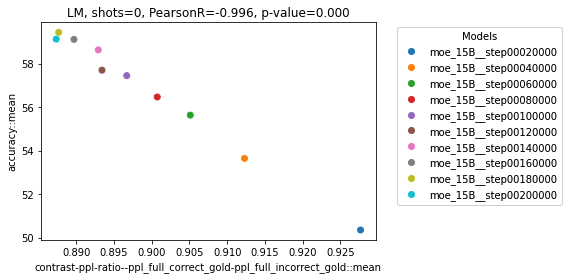

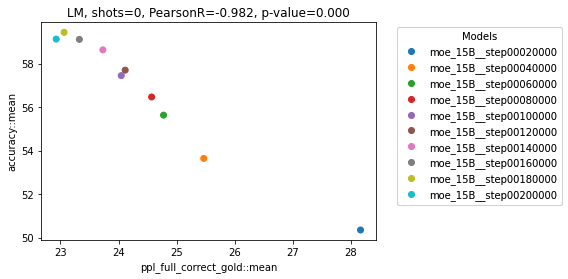

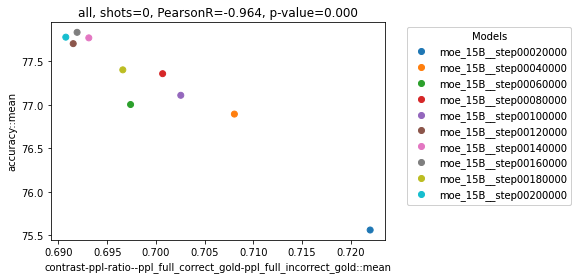

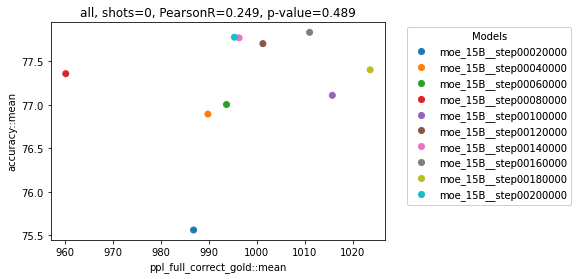

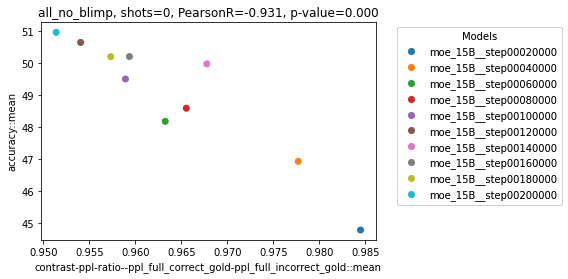

...

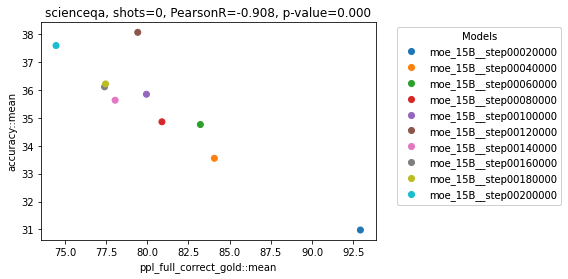

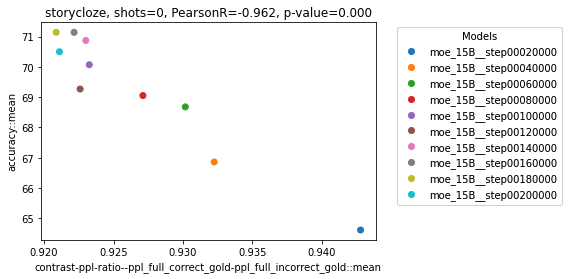

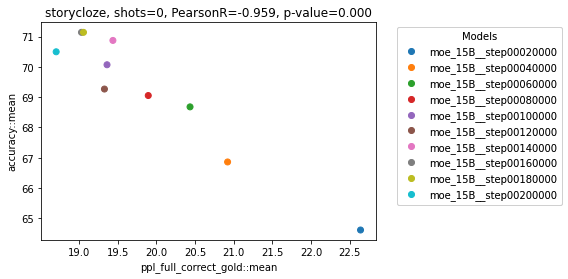

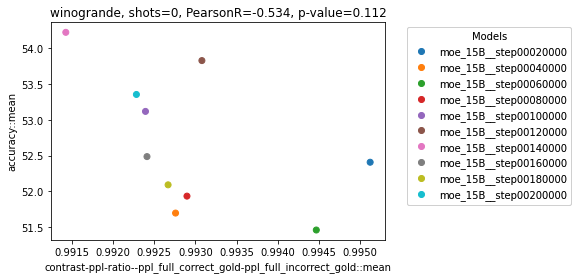

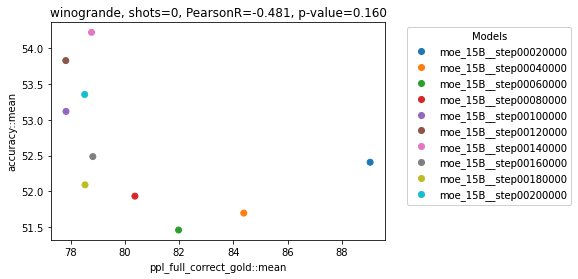

In [40]:
# ppl to accuracy scatter
show_scatter_plot = True
scatter_only_groups = False
scatter_fields = [x for x in ppl_cols[:] if ("ppl-ratio--ppl_full_" in x)
                  #or ("ppl_full_correct_lt_incorrect_gold" in x)
                  or ("ppl_full_correct_gold" in x)
                 ]

# field to 
show_steps_to_metric = False
step_target_fields = [x for x in ppl_cols[:] if ("ppl-ratio--ppl_full_" in x)
                  #or ("ppl_full_correct_lt_incorrect_gold" in x)
                 ] + [main_target_metric]

def aggr_values(kv):
    map_kv = {}
    for k,v in kv:
        if k not in map_kv:
            map_kv[k] = [v]
        else:
            map_kv[k].append(v)
    map_kv = [(k,np.mean(v)) for k,v in map_kv.items()]
    
    return map_kv

# calculate the correlations
idx_to_correlation_vals = {}

idx_to_metrics_by_model = {}

metric_cols_all = []
ppl_cols_all = []

for idx, row in metric_pt.iterrows():
    #print(idx, row.items())
    curr_task_name = idx[0]
    curr_shots=idx[3]
    #print(curr_task_name)
    #break
    
    
    cols_with_vals_by_model = {}
    
    for [col, model], val in row.items():
        if not col.endswith("::mean"):
            # Use only result columns
            continue
        if col not in cols_with_vals_by_model:
            cols_with_vals_by_model[col] = []
        cols_with_vals_by_model[col].append((model, val))
    
    #print(f"cols_with_vals_by_model:{cols_with_vals_by_model}")
    #break
    # sort model names and values
    for col in cols_with_vals_by_model.keys():
        cols_with_vals_by_model[col] = sorted(cols_with_vals_by_model[col], key=lambda x: x[0])
        
    idx_to_metrics_by_model[idx] = cols_with_vals_by_model
    
    columns = cols_with_vals_by_model.keys()
    ppl_cols = [x for x in columns if "ppl" in x]
    ppl_cols_all.extend(ppl_cols)
    
    metric_cols = [x for x in columns if x not in ppl_cols]
    metric_cols_all.extend(metric_cols)
    
    
    
    correlation_values = {}
    for metric_col in metric_cols:
        for ppl_col in ppl_cols:
            #print(metric_col, ppl_col)
            
            ppl_model_vals = cols_with_vals_by_model[ppl_col]
            #print(f"ppl_model_vals:{ppl_model_vals}")
            metric_model_vals = cols_with_vals_by_model[metric_col]
            #print(f"metric_model_vals:{metric_model_vals}")
            #break
            
            # select only models 
            common_models = set([x[0] for x in ppl_model_vals]).intersection(set([y[0] for y in metric_model_vals]))
            
            ppl_model_vals = [x for x in ppl_model_vals if x[0] in common_models]
            ppl_model_vals = aggr_values(ppl_model_vals)
            ppl_model_vals = sorted(ppl_model_vals, key = lambda x:x[0])
            
            metric_model_vals = [x for x in metric_model_vals if x[0] in common_models]
            metric_model_vals = aggr_values(metric_model_vals)
            metric_model_vals = sorted(metric_model_vals, key = lambda x:x[0])
            
            
            ppl_models, ppl_vals = zip(*ppl_model_vals)
            metric_models, metric_vals = zip(*metric_model_vals)
            
            assert all([x[0] == x[1] for x in zip(ppl_models, metric_models)]), (idx, metric_col, metric_models, ppl_col, ppl_model_vals)  # assert model names match
            # filter nan values
            #print("Ok")
            
            ppl_metric_non_empty = [x for x in zip(ppl_vals, metric_vals, ppl_models) if not np.isnan(x[0]) and x[0] > 0 and not np.isnan(x[1]) and x[1]>0]
                
            if len(ppl_metric_non_empty) > 2:
                ppl_vals_non_empty, metric_vals_non_empty, models_non_empty = zip(*ppl_metric_non_empty)
            
                pearsonr, pvalue = stats.pearsonr(ppl_vals_non_empty, metric_vals_non_empty) 
                for corr_k, corr_v in [("pearsonr", pearsonr), ("pvalue",pvalue)]:
                    corr_key = f"corr-models--{ppl_col}--{metric_col}--{corr_k}"
                    correlation_values[corr_key] = corr_v
                    
                if show_scatter_plot and ppl_col in scatter_fields:
                    if scatter_only_groups and curr_task_name not in task_display_groups:
                        continue
                        
                    color_value_names = list(sorted(list(set(models_non_empty))))
                    color_field_to_id = {t: i for i,t in enumerate(color_value_names)}
                    color_values = [color_field_to_id[t] for t in list(models_non_empty)]
    
                    fig = plt.figure()
                    ax = fig.add_subplot(111)
                    scatter = ax.scatter(x=ppl_vals_non_empty, 
                                         y=metric_vals_non_empty,
                                         c=color_values,
                                         cmap="tab10",
                                         )
                
                    # Color legend
                    try:
                        color_handles, _ = scatter.legend_elements()
                        color_legend = ax.legend(color_handles, color_value_names, bbox_to_anchor = (1.05, 1.0), loc='upper left', title="Models")
                        ax.add_artist(color_legend)
                    except Exception:
                        print("Error")
                        
                    plt.xlabel(ppl_col)
                    plt.ylabel(metric_col)
                    plt.title(f"{curr_task_name}, shots={curr_shots}, PearsonR={pearsonr:.3f}, p-value={pvalue:.3f}")
                    
    pearsonr_cols_vals = [(k, v) for k,v in correlation_values.items() if "pearsonr" in k and not np.isnan(v)]
    if len(pearsonr_cols_vals) > 0:
        pearsonr_cols, pearsonr_vals = zip(*pearsonr_cols_vals)
        correlation_values["_corrs-pearsonr-avg"] = np.mean([x for x in pearsonr_vals]) 
        max_corr_id = np.argmax([abs(x) for x in pearsonr_vals]) 
        correlation_values["_corrs-pearsonr-max-val"] = pearsonr_vals[max_corr_id]
        correlation_values["_corrs-pearsonr-max-col"] = pearsonr_cols[max_corr_id]
        
        mean_correlations_by_fewshot[shot][col] = np.mean(vals)
        #break

mean_corr_by_fs_ds = DataFrame.from_dict(mean_correlations_by_fewshot)

#print(mean_corr_by_fs_ds)
corr_cols = [x.split("--")[1:-2] for x in list(mean_corr_by_fs_ds.index)]
corr_cols = ["--".join(x).replace("::mean", "") for x in corr_cols]

mean_corr_by_fs_ds["ppl_field"] = corr_cols
mean_corr_by_fs_ds["cm"] = [x.split("--")[-1] for x in list(mean_corr_by_fs_ds.index)]
mean_corr_by_fs_ds = mean_corr_by_fs_ds[(mean_corr_by_fs_ds["cm"] == "pearsonr") | (mean_corr_by_fs_ds["cm"] == "pvalue")]

#mean_corr_by_fs_ds = mean_corr_by_fs_ds.sort_values(by=[0])

# group
mean_corr_by_fs_ds = pd.pivot_table(mean_corr_by_fs_ds, values=n_shots, index=["ppl_field"],
                        columns=["cm"], aggfunc=np.mean)
out_file = results_json+"_ppl_correlations_mean.tsv"
mean_corr_by_fs_ds.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

mean_corr_by_fs_ds
#mean_corr_by_fs_ds.sort_values((0, 'pearsonr'), ascending=True)

In [18]:
fixed_columns = [x.strip() for x in "corr-models--contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_correct_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_correct_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_correct_lt_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_correct_lt_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_min_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_min_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_std_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_std_gold::mean--accuracy::mean--pvalue	corr-models--ppl_calib_candidates::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_candidates::mean--accuracy::mean--pvalue	corr-models--ppl_calib_candidates_full_prompt::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_candidates_full_prompt::mean--accuracy::mean--pvalue	corr-models--ppl_calib_common_prefix::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_common_prefix::mean--accuracy::mean--pvalue	corr-models--ppl_calib_full_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_full_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompt_gold_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompt_gold_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompt_gold_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompt_gold_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_max_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_max_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_max_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_max_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_mean_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_mean_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_mean_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_mean_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_min_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_min_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_min_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_min_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_std_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_std_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_std_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_std_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_candidates::mean--accuracy::mean--pearsonr	corr-models--ppl_candidates::mean--accuracy::mean--pvalue	corr-models--ppl_candidates_full_prompt::mean--accuracy::mean--pearsonr	corr-models--ppl_candidates_full_prompt::mean--accuracy::mean--pvalue	corr-models--ppl_common_prefix::mean--accuracy::mean--pearsonr	corr-models--ppl_common_prefix::mean--accuracy::mean--pvalue	corr-models--ppl_full_correct_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_correct_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_correct_lt_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_correct_lt_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_min_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_min_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_std_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_std_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_full_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_selected_candidate::mean--accuracy::mean--pvalue".split("\t")]
fixed_columns = [x.split("--")[-3] for x in fixed_columns]
fixed_columns = [x if i%2 ==0 else "" for i,x in enumerate(fixed_columns)]
fixed_columns

print("|".join(fixed_columns))
print("|".join(["pearsonr" if i%2 ==0 else "pvalue" for i, x in enumerate(fixed_columns)]))

ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean||ppl_full_correct_gold-ppl_full_incorrect_gold::mean||ppl_answer_correct_gold::mean||ppl_answer_correct_lt_incorrect_gold::mean||ppl_answer_incorrect_gold::mean||ppl_answer_incorrect_min_gold::mean||ppl_answer_incorrect_std_gold::mean||ppl_calib_candidates::mean||ppl_calib_candidates_full_prompt::mean||ppl_calib_common_prefix::mean||ppl_calib_full_selected_candidate::mean||ppl_calib_prompt_gold_mean::mean||ppl_calib_prompt_gold_std::mean||ppl_calib_prompts_cands_max_mean::mean||ppl_calib_prompts_cands_max_std::mean||ppl_calib_prompts_cands_mean_mean::mean||ppl_calib_prompts_cands_mean_std::mean||ppl_calib_prompts_cands_min_mean::mean||ppl_calib_prompts_cands_min_std::mean||ppl_calib_prompts_cands_std_mean::mean||ppl_calib_prompts_cands_std_std::mean||ppl_calib_selected_candidate::mean||ppl_candidates::mean||ppl_candidates_full_prompt::mean||ppl_common_prefix::mean||ppl_full_correct_gold::mean||ppl_full_correct_lt_incorrect_gold::m

In [19]:
raise("Stop auto execution here")

TypeError: exceptions must derive from BaseException

# Display by steps
Below, we plot results for multiple checkpoints.

In [20]:
#Example for idx_to_metrics_by_model:
debug_custom=False
if debug_custom:
    idx_to_metrics_by_model = {('knowledge__common_sense',  # task_name or group_name
      'en',
      '*',
      0,
      'accuracy'): {'accuracy::mean': [('1.3B_gpt3_setting__step00020000',
        42.86994622585142),
       ('1.3B_gpt3_setting__step00050000', 49.581756622186816),
       ('1.3B_gpt3_setting__step00100000', 53.316072495518824),
       ('1.3B_gpt3_setting__step00150000', 55.67616012746465),
       ('1.3B_gpt3_setting__step00200000', 57.040430193188605),
       ('1.3B_gpt3_setting__step00250000',
        58.1557458673571)], },
    ('knowledge',  # task_name or group_name
      'en',
      '*',
      0,
      'accuracy'): {'accuracy::mean': [('1.3B_gpt3_setting__step00020000',
        52.86994622585142),
       ('1.3B_gpt3_setting__step00050000', 59.581756622186816),
       ('1.3B_gpt3_setting__step00100000', 53.316072495518824),
       ('1.3B_gpt3_setting__step00150000', 55.67616012746465),
       ('1.3B_gpt3_setting__step00200000', 57.040430193188605),
       ('1.3B_gpt3_setting__step00250000',
        68.1557458673571)], }
    }


    #If you want to plot multiple lines on the same plot, define task_to_group or group_to_group mappings
    task_to_groups = {
    "knowledge__common_sense": ["knowledge"]
    }


In [41]:
task_settings_with_metrics = [x[0] for x in idx_to_metrics_by_model.keys()]


exported to /checkpoint/tbmihaylov/few_shot/2021-09-28-ppl-eval/results.tsv.raw.jsonl_ppl_correlations_by_task_sort_by_shots.tsv


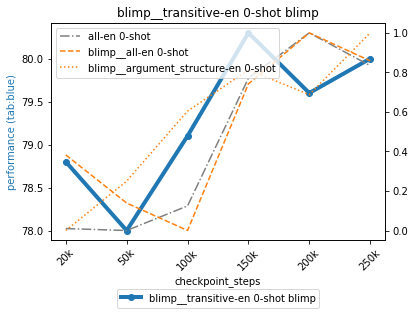

In [23]:
correlation_data_new = correlation_data[correlation_data.columns]
#print(correlation_data_new)
correlation_data_new.reset_index(inplace=True)
correlation_data_new = correlation_data_new.sort_values(by=["level_3", "level_0"])

out_file = results_json+"_ppl_correlations_by_task_sort_by_shots.tsv"
correlation_data_new.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

set(correlation_data_new["level_0"])

In [42]:
# mean correlations by few_shot size

mean_correlations_by_fewshot = {}

n_shots = list(set(correlation_data_new["level_3"]))
for shot in n_shots:
    if shot not in mean_correlations_by_fewshot:
        mean_correlations_by_fewshot[shot] = {}
    
    corr_data_curr = correlation_data_new[correlation_data_new["level_3"] == shot]
    for col in corr_data_curr.columns:
        vals = list(corr_data_curr[col])
        #print(vals)
        try:
            vals = [x for x in vals if not np.isnan(x)]
        except:
            #print(col)
            continue
        
        mean_correlations_by_fewshot[shot][col] = np.mean(vals)
        #break

mean_corr_by_fs_ds = DataFrame.from_dict(mean_correlations_by_fewshot)

#print(mean_corr_by_fs_ds)
corr_cols = [x.split("--")[1:-2] for x in list(mean_corr_by_fs_ds.index)]
corr_cols = ["--".join(x).replace("::mean", "") for x in corr_cols]

mean_corr_by_fs_ds["ppl_field"] = corr_cols
mean_corr_by_fs_ds["cm"] = [x.split("--")[-1] for x in list(mean_corr_by_fs_ds.index)]
mean_corr_by_fs_ds = mean_corr_by_fs_ds[(mean_corr_by_fs_ds["cm"] == "pearsonr") | (mean_corr_by_fs_ds["cm"] == "pvalue")]

#mean_corr_by_fs_ds = mean_corr_by_fs_ds.sort_values(by=[0])

# group
mean_corr_by_fs_ds = pd.pivot_table(mean_corr_by_fs_ds, values=n_shots, index=["ppl_field"],
                        columns=["cm"], aggfunc=np.mean)
out_file = results_json+"_ppl_correlations_mean.tsv"
mean_corr_by_fs_ds.to_csv(out_file, sep="\t")
print(f"exported to {out_file}")

mean_corr_by_fs_ds
#mean_corr_by_fs_ds.sort_values((0, 'pearsonr'), ascending=True)

exported to /checkpoint/tbmihaylov/few_shot/2021-09-28-ppl-eval/results.tsv.raw.jsonl_ppl_correlations_mean.tsv


0          
cm                                                  pearsonr    pvalue
ppl_field                                                             
contrast-ppl-ratio--ppl_answer_correct_gold-ppl... -0.572927  0.170701
contrast-ppl-ratio--ppl_full_correct_gold-ppl_f... -0.669970  0.129930
ppl_answer_correct_gold                            -0.240513  0.370306
ppl_answer_correct_lt_incorrect_gold                0.986151  0.007727
ppl_answer_incorrect_gold                           0.255560  0.309807
ppl_answer_incorrect_min_gold                       0.225592  0.314198
ppl_answer_incorrect_std_gold                       0.454264  0.156011
ppl_calib_candidates                                0.392660  0.324285
ppl_calib_candidates_full_prompt                   -0.162802  0.526137
ppl_calib_common_prefix                            -0.082844  0.588130
ppl_calib_full_selected_candidate                  -0.375548  0.341242
ppl_calib_prompt_gold_mean                         -0.138980  0.521084
ppl_calib_prompt_gold_std                           0.147638  0.599122
ppl_calib_prompts_cands_max_mean                   -0.039745  0.649124
ppl_calib_prompts_cands_max_std                     0.154914  0.591696
ppl_calib_prompts_cands_mean_mean                  -0.162144  0.527316
ppl_calib_prompts_cands_mean_std                   -0.081839  0.610387
ppl_calib_prompts_cands_min_mean                   -0.361939  0.363932
ppl_calib_prompts_cands_min_std                    -0.282042  0.452022
ppl_calib_prompts_cands_std_mean                    0.031865  0.683913
ppl_calib_prompts_cands_std_std                     0.193772  0.614543
ppl_calib_selected_candidate                       -0.014908  0.600835
ppl_candidates                                      0.095016  0.367452
ppl_candidates_full_prompt                         -0.003357  0.329338
ppl_common_prefix                                  -0.051754  0.415392
ppl_full_correct_gold                              -0.268159  0.314100
ppl_full_correct_lt_incorrect_gold                  0.969823  0.010567
ppl_full_incorrect_gold                             0.134884  0.270209
ppl_full_incorrect_min_gold                         0.135292  0.270296
ppl_full_incorrect_std_gold                        -0.825387  0.009309
ppl_full_selected_candidate                        -0.150423  0.336126
ppl_selected_candidate                             -0.120418  0.330351

In [43]:
fixed_columns = [x.strip() for x in "corr-models--contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--contrast-ppl-ratio--ppl_answer_correct_gold-ppl_answer_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_correct_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_correct_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_correct_lt_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_correct_lt_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_min_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_min_gold::mean--accuracy::mean--pvalue	corr-models--ppl_answer_incorrect_std_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_answer_incorrect_std_gold::mean--accuracy::mean--pvalue	corr-models--ppl_calib_candidates::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_candidates::mean--accuracy::mean--pvalue	corr-models--ppl_calib_candidates_full_prompt::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_candidates_full_prompt::mean--accuracy::mean--pvalue	corr-models--ppl_calib_common_prefix::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_common_prefix::mean--accuracy::mean--pvalue	corr-models--ppl_calib_full_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_full_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompt_gold_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompt_gold_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompt_gold_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompt_gold_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_max_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_max_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_max_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_max_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_mean_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_mean_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_mean_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_mean_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_min_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_min_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_min_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_min_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_std_mean::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_std_mean::mean--accuracy::mean--pvalue	corr-models--ppl_calib_prompts_cands_std_std::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_prompts_cands_std_std::mean--accuracy::mean--pvalue	corr-models--ppl_calib_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_calib_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_candidates::mean--accuracy::mean--pearsonr	corr-models--ppl_candidates::mean--accuracy::mean--pvalue	corr-models--ppl_candidates_full_prompt::mean--accuracy::mean--pearsonr	corr-models--ppl_candidates_full_prompt::mean--accuracy::mean--pvalue	corr-models--ppl_common_prefix::mean--accuracy::mean--pearsonr	corr-models--ppl_common_prefix::mean--accuracy::mean--pvalue	corr-models--ppl_full_correct_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_correct_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_correct_lt_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_correct_lt_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_min_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_min_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_incorrect_std_gold::mean--accuracy::mean--pearsonr	corr-models--ppl_full_incorrect_std_gold::mean--accuracy::mean--pvalue	corr-models--ppl_full_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_full_selected_candidate::mean--accuracy::mean--pvalue	corr-models--ppl_selected_candidate::mean--accuracy::mean--pearsonr	corr-models--ppl_selected_candidate::mean--accuracy::mean--pvalue".split("\t")]
fixed_columns = [x.split("--")[-3] for x in fixed_columns]
fixed_columns = [x if i%2 ==0 else "" for i,x in enumerate(fixed_columns)]
fixed_columns

print("|".join(fixed_columns))
print("|".join(["pearsonr" if i%2 ==0 else "pvalue" for i, x in enumerate(fixed_columns)]))

fig:('rte', 'en', 'rte', 0, 'accuracy')


In [44]:
raise("Stop auto execution here")

TypeError: exceptions must derive from BaseException

# Display by steps
Below, we plot results for multiple checkpoints.

In [ ]:
#Example for idx_to_metrics_by_model:
debug_custom=False
if debug_custom:
    idx_to_metrics_by_model = {('knowledge__common_sense',  # task_name or group_name
      'en',
      '*',
      0,
      'accuracy'): {'accuracy::mean': [('1.3B_gpt3_setting__step00020000',
        42.86994622585142),
       ('1.3B_gpt3_setting__step00050000', 49.581756622186816),
       ('1.3B_gpt3_setting__step00100000', 53.316072495518824),
       ('1.3B_gpt3_setting__step00150000', 55.67616012746465),
       ('1.3B_gpt3_setting__step00200000', 57.040430193188605),
       ('1.3B_gpt3_setting__step00250000',
        58.1557458673571)], },
    ('knowledge',  # task_name or group_name
      'en',
      '*',
      0,
      'accuracy'): {'accuracy::mean': [('1.3B_gpt3_setting__step00020000',
        52.86994622585142),
       ('1.3B_gpt3_setting__step00050000', 59.581756622186816),
       ('1.3B_gpt3_setting__step00100000', 53.316072495518824),
       ('1.3B_gpt3_setting__step00150000', 55.67616012746465),
       ('1.3B_gpt3_setting__step00200000', 57.040430193188605),
       ('1.3B_gpt3_setting__step00250000',
        68.1557458673571)], }
    }


    #If you want to plot multiple lines on the same plot, define task_to_group or group_to_group mappings
    task_to_groups = {
    "knowledge__common_sense": ["knowledge"]
    }


In [ ]:
#idx_to_metrics_by_model

In [ ]:
task_settings_with_metrics = [x[0] for x in idx_to_metrics_by_model.keys()]


In [ ]:
def flatten(list_of_lists):
    return [item for sublist in list_of_lists for item in sublist]

max_plotted = 0
# task_to_groups
# task_display_groups
def normalize(vals, lower=0.0, upper=1.0):
    min_val = min(vals)
    max_val = max(vals)
    return [lower + (x - min_val) * (upper - lower)/(0.0001 + max_val - min_val) for x in vals]
    
def get_plot_fields(v, col_info, related_vals=False):
    metric_key = col_info["key"]
    vals_func = col_info["vals_func"]
    if related_vals:
        rel_vals_func = col_info.get("related_vals_func", None)
        if rel_vals_func is not None:
            vals_func = rel_vals_func
        
        rel_lbl = False
        
    vals = vals_func(v[metric_key])
    lbl = col_info["lbl"] if not related_vals else col_info.get("rel_lbl", col_info["lbl"])
    
    return lbl, vals

# Line styles
main_style = {"color":"tab:blue", "linewidth":4, "marker":'o'}
special_styles = {"all": {"linestyle":"-.", "color":"tab:gray"}}
related_styles = [{"color":cl, "linestyle":lst} for cl in ["tab:orange", "tab:green", "tab:red", "tab:purple", 
                                                           "tab:brown", "tab:pink", "tab:olive", "tab:cyan"]
                                                for lst in ["dashed", "dotted"] ]

    

# ('arceasy', 'en', 'arc_old', 0, 'accuracy'), {'accuracy::mean': [('1.3B_gpt3_setting__step00020000', 46.11283873833852), ('1.3B_gpt3_setting__step00050000', 50.06663705019991), ('1.3B_gpt3_setting__step00100000', 51.66592625499778), ('1.3B_gpt3_setting__step00150000', 52.59884495779654)
x_columns = [{'lbl': "checkpoint_steps", "key": 'accuracy::mean', "vals_func": lambda vals: [str(int(get_checkpoint_step_form_modelname(x)/1000))+'k' for x, y in vals]}]
y_columns = [
    {'lbl': "performance", "key": 'accuracy::mean', "vals_func": lambda vals: [y for x, y in vals],
                                  'rel_lbl': "performance (normalized)",  "related_vals_func": lambda vals: normalize([y for x, y in vals])},
             #{'lbl': "ppl-contrast - normalized", "key": 'contrast-ppl-ratio--ppl_full_correct_gold-ppl_full_incorrect_gold::mean', "vals_func": lambda vals: normalize([y for x, y in vals])}
 #            {'lbl': "performance", "key": 'accuracy::mean', "vals_func": lambda vals: [y for x, y in vals], "plot_related": False},
            ]


plotted_cnt =  0 

nshots_eq = 0
if nshots_eq is not None:
    print(f"Filtering only nshots=={nshots_eq}! Set nshots_eq to None to remove the filter!")
    
for exp_setting, exp_results in idx_to_metrics_by_model.items():
    task=exp_setting[0]
    if nshots_eq is not None and exp_setting[3] != nshots_eq:
        continue
    
    print(f"fig:{exp_setting}")
    
    group_prefix = ""
    if task in groups_to_groups:
        group_prefix = "_"
    title = "{group_prefix}{task}-{lang} {shots}-shot {template}".format(task=task, lang=exp_setting[1], template=exp_setting[2], shots=exp_setting[3], group_prefix=group_prefix)
    main_results = exp_results  # these are the results to plot as main
    #print(main_results)
    
    # we also plate the grouped results where the current seting participates
    related_results = []
    curr_task_groups = list(set(task_to_groups.get(task, []) + groups_to_groups.get(task, [])))
    for ctg in curr_task_groups:
        rel_result_key = (ctg, exp_setting[1], "*", exp_setting[3], exp_setting[4])
        if rel_result_key in idx_to_metrics_by_model:
            related_results.append((rel_result_key, idx_to_metrics_by_model[rel_result_key]))
    related_results.sort(key = lambda x: x[0][0])
    
    for x_col in x_columns:
        for y_col in y_columns:
            plot_rel_on_sep_ax = "related_vals_func" in y_col
            plt.rcParams['axes.facecolor']='white'
            fig, ax_main = plt.subplots()
            rect = fig.patch
            rect.set_facecolor("white")
            
            ax_rel = ax_main.twinx() if plot_rel_on_sep_ax else ax_main
            
            # main results
            x_lbl, x_vals, y_lbl, y_vals = get_plot_fields(main_results, x_col) + get_plot_fields(main_results, y_col)
            ax_main.plot(x_vals, y_vals, label=title, **main_style)
            ax_main.set_xticklabels(ax_main.get_xticks(), rotation = 45)
            ax_main.set_ylabel(f"{y_lbl} ({main_style['color']})", color=main_style['color'])
            ax_main.set_xlabel(x_lbl)
            
            
            
            if y_col.get("plot_related", True):
                rel_style_id = 0
                # related results (groups)
                for rel_setting, rel_result in related_results:
                    rel_task_name = rel_setting[0]
                    rel_title = "{task}-{lang} {shots}-shot".format(task=rel_task_name, lang=rel_setting[1], shots=rel_setting[3])
                    _, rel_x_vals, rel_y_lbl, rel_y_vals = get_plot_fields(rel_result, x_col, related_vals=True) + get_plot_fields(rel_result, y_col, related_vals=True)

                    # style 
                    rel_style = special_styles.get(rel_task_name, None)
                    if rel_style is None:
                        rel_style = related_styles[rel_style_id]
                        rel_style_id += 1

                    ax_rel.plot(rel_x_vals, rel_y_vals, label=rel_title, **rel_style)
                
#                 if plot_rel_on_sep_ax:
#                     ax_rel.set_ylabel(f"{rel_y_lbl}")
            
            if plot_rel_on_sep_ax:
                ax_rel.legend()
                ax_main.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2))
            else:
                ax_main.legend()
                
            plt.title(title)
            plt.show()
    
    plotted_cnt += 1
    if max_plotted > 0 and plotted_cnt> max_plotted:
        break


